In [1]:
import numpy as np
import pandas as pd
import joblib

X_train = np.load('D:/projects/XAI-finance2/matrices/X_train.npy')
X_test = np.load('D:/projects/XAI-finance2/matrices/X_test.npy')
y_test = np.load('D:/projects/XAI-finance2/matrices/y_test.npy')

In [2]:
loaded_rfc_model = joblib.load('D:/projects/XAI-finance2/FinalModels/rfc_pickle.pkl')

# print('model successfully loaded: Score is-')
result = loaded_rfc_model.score(X_test, y_test)



In [4]:
result

0.7409024745269287

In [5]:
pip install lime


  Using cached lime-0.2.0.1.tar.gz (275 kB)
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283845 sha256=19a0a5672565a8d342b4b7270a93efb2f6a33ee7f54df9ae2f4bc98677cba629
  Stored in directory: c:\users\khushali\appdata\local\pip\cache\wheels\e6\a6\20\cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime


In [5]:

import lime
import lime.lime_tabular

# Lambda function for getting predicted probability of target variable
predict_fn_rf = lambda x: loaded_rfc_model.predict_proba(x).astype(float)

# Lining up feature names
feature_names = ['RiskPerformance', 'ExternalRiskEstimate', 'MSinceOldestTradeOpen', 'MSinceMostRecentTradeOpen', 'AverageMInFile', 'NumSatisfactoryTrades', 'NumTrades60Ever2DerogPubRec', 'NumTrades90Ever2DerogPubRec', 'PercentTradesNeverDelq', 'MSinceMostRecentDelq', 'MaxDelq2PublicRecLast12M', 'MaxDelqEver', 'NumTotalTrades', 'NumTradesOpeninLast12M', 'PercentInstallTrades', 'NumInqLast6M', 'NumInqLast6Mexcl7days', 'NetFractionRevolvingBurden', 'NetFractionInstallBurden', 'NumRevolvingTradesWBalance', 'NumInstallTradesWBalance', 'NumBank2NatlTradesWHighUtilization', 'PercentTradesWBalance']


# Creating the LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names = feature_names[1:], 
                                                   class_names = ["High Credit Risk", "Low Credit Risk"], 
                                                   verbose=True,
                                                   categorical_features =['RiskPerformance'],
                                                   categorical_names = ['RiskPerformance'],
                                                   mode='classification',
                                                   discretize_continuous=True,
                                                   discretizer='quartile',
                                                   kernel_width = 3)



In [6]:
exp = explainer.explain_instance(X_test[0], 
                                    predict_fn_rf, 
                                    num_features = 5)
exp.show_in_notebook(show_table=True)

Intercept 0.507701765672237
Prediction_local [0.36147855]
Right: 0.3759950195916915


In [8]:
for i in range(5):
    exp = explainer.explain_instance(X_test[i], 
                                    predict_fn_rf, 
                                    num_features = 5)
    exp.show_in_notebook(show_table=True)

Intercept 0.5120134589927127
Prediction_local [0.36366473]
Right: 0.3759950195916915


Intercept 0.4054229899869081
Prediction_local [0.56497608]
Right: 0.5176109129311282


Intercept 0.5418901107310641
Prediction_local [0.24938675]
Right: 0.23529963371247858


Intercept 0.414164877266347
Prediction_local [0.5347785]
Right: 0.5429002896606343


Intercept 0.4161068822103464
Prediction_local [0.54009476]
Right: 0.599101549762288


In [9]:
def generate_exp1(x_test):
    # Pick the observation for which validation is required
    pred = loaded_rfc_model.predict_proba(x_test.reshape(1, -1)).astype(float)
    pred_good = pred[:,1]
    
    exp = explainer.explain_instance(x_test, 
                                    predict_fn_rf, 
                                    num_features = 10)
    
    
    mapexp = exp.as_map()
    anchs_vec = mapexp[1]

#     strexp = exptext.generate_text_explanation(pred_good, x_test, anchs_vec) 
    if pred_good>0.5:
        pred_good = 1
    else:
        pred_good=0
    # pred_good = np.array(np.greater(pred[:,1], 0.5), dtype=int)
    return pred_good


In [9]:
# TESTING OF MODULE
def test():
    print('**TEST**')
    print(loaded_rfc_model.classes_)

    pred_good = generate_exp1(X_test[1]) # for testing purpose
    
    print('predgood: ', pred_good)

    count = 0
    for i in range(0, len(y_test)):
        pred_good = generate_exp1(X_test[i]) # for testing purpose
        
        if(pred_good==y_test[i]):
            count = count+1
    
    acc = count/len(y_test)
    print('Accuracy: ', acc)
    return
    

In [8]:
test()

**TEST**
[0 1]
Intercept 0.4042378716065513
Prediction_local [0.53792141]
Right: 0.5176109129311282
predgood:  1
Intercept 0.5084283429694672
Prediction_local [0.33636934]
Right: 0.3759950195916915
Intercept 0.40323311095388414
Prediction_local [0.54702668]
Right: 0.5176109129311282
Intercept 0.5416811671283469
Prediction_local [0.23633765]
Right: 0.23529963371247858
Intercept 0.4184208004838812
Prediction_local [0.4944707]
Right: 0.5429002896606343
Intercept 0.3909617125448987
Prediction_local [0.5562679]
Right: 0.599101549762288
Intercept 0.4500628370596987
Prediction_local [0.50035937]
Right: 0.6191250613078014
Intercept 0.576125868308504
Prediction_local [0.14933703]
Right: 0.14076869368161934
Intercept 0.5504151862492777
Prediction_local [0.23460792]
Right: 0.2589540397713941
Intercept 0.4725226863144324
Prediction_local [0.44417246]
Right: 0.43963091329894743
Intercept 0.3683715388266851
Prediction_local [0.66268503]
Right: 0.7069821611313992
Intercept 0.5456001358984606
Predicti

# Neural Network

# SVM

In [7]:
import numpy as np
import pandas as pd
import joblib

X_train = np.load('D:/projects/XAI-finance2/matrices/X_train_standard.npy')
X_test = np.load('D:/projects/XAI-finance2/matrices/X_test_standard.npy')
y_test = np.load('D:/projects/XAI-finance2/matrices/y_test.npy')

In [8]:
loaded_svm_model = joblib.load('D:/projects/XAI-finance2/FinalModels/svm_pickle.pkl')

# print('model successfully loaded: Score is-')
result = loaded_svm_model.score(X_test, y_test)



In [9]:
result

0.7379912663755459

In [11]:
#pip install lime

In [10]:

import lime
import lime.lime_tabular

# Lambda function for getting predicted probability of target variable
predict_fn_svm = lambda x: loaded_svm_model.predict_proba(x).astype(float)



# Lining up feature names
feature_names = ['RiskPerformance', 'ExternalRiskEstimate', 'MSinceOldestTradeOpen', 'MSinceMostRecentTradeOpen', 'AverageMInFile', 'NumSatisfactoryTrades', 'NumTrades60Ever2DerogPubRec', 'NumTrades90Ever2DerogPubRec', 'PercentTradesNeverDelq', 'MSinceMostRecentDelq', 'MaxDelq2PublicRecLast12M', 'MaxDelqEver', 'NumTotalTrades', 'NumTradesOpeninLast12M', 'PercentInstallTrades', 'NumInqLast6M', 'NumInqLast6Mexcl7days', 'NetFractionRevolvingBurden', 'NetFractionInstallBurden', 'NumRevolvingTradesWBalance', 'NumInstallTradesWBalance', 'NumBank2NatlTradesWHighUtilization', 'PercentTradesWBalance']


# Creating the LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names = feature_names[1:], 
                                                   class_names = ["High Credit Risk", "Low Credit Risk"], 
                                                   verbose=True,
                                                   categorical_features =['RiskPerformance'],
                                                   categorical_names = ['RiskPerformance'],
                                                   mode='classification',
                                                   discretize_continuous=True,
                                                   discretizer='quartile',
                                                   kernel_width = 3)



In [11]:
exp = explainer.explain_instance(X_test[0], 
                                    predict_fn_svm, 
                                    num_features = 5)
exp.show_in_notebook(show_table=True)

Intercept 0.44133220559425
Prediction_local [0.26121394]
Right: 0.33564826381973134


# FEATURE IMPORTANCE { Global}

In [16]:
pip install eli5

  Using cached eli5-0.13.0-py2.py3-none-any.whl
  Using cached Jinja2-3.1.2-py3-none-any.whl (133 kB)
  Using cached tabulate-0.9.0-py3-none-any.whl (35 kB)
  Using cached graphviz-0.20.1-py3-none-any.whl (47 kB)
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cookiecutter 1.7.2 requires Jinja2<3.0.0, but you have jinja2 3.1.2 which is incompatible.
cookiecutter 1.7.2 requires MarkupSafe<2.0.0, but you have markupsafe 2.1.2 which is incompatible.


In [4]:
from tensorflow import keras
from keras import backend
import eli5
from eli5.sklearn import PermutationImportance

def get_feature_importance(model, X, y, feature_names):
    perm = PermutationImportance(model, random_state=42).fit(X, y)
    return eli5.show_weights(perm, feature_names=feature_names)

AttributeError: module 'tensorflow.compat.v2.__internal__' has no attribute 'register_clear_session_function'

#### Random Forest feature imp

In [ ]:
loaded_rfc_model = joblib.load('D:/projects/XAI-finance2/FinalModels/rfc_pickle.pkl')

# print('model successfully loaded: Score is-')
result = loaded_rfc_model.score(X_test, y_test)
result

In [12]:
# xgb_model = xgb.XGBClassifier(n_estimators=100, max_depth=5, colsample_bytree=0.8, subsample=0.5).fit(X_train, y_train)
get_feature_importance(loaded_rfc_model, X_test, y_test, feature_names[1:])

Weight,Feature
0.0318 ± 0.0112,ExternalRiskEstimate
0.0112 ± 0.0087,NetFractionRevolvingBurden
0.0112 ± 0.0043,AverageMInFile
0.0036 ± 0.0048,PercentTradesNeverDelq
0.0025 ± 0.0053,NumSatisfactoryTrades
0.0022 ± 0.0031,NetFractionInstallBurden
0.0020 ± 0.0038,NumInqLast6Mexcl7days
0.0017 ± 0.0054,NumBank2NatlTradesWHighUtilization
0.0013 ± 0.0022,NumTotalTrades
0.0012 ± 0.0033,NumInqLast6M


#### SVM Feature Imp

In [15]:
loaded_svm_model = joblib.load('D:/projects/XAI-finance2/FinalModels/svm_pickle.pkl')

# print('model successfully loaded: Score is-')
result = loaded_svm_model.score(X_test, y_test)
result

0.7379912663755459

In [16]:
# xgb_model = xgb.XGBClassifier(n_estimators=100, max_depth=5, colsample_bytree=0.8, subsample=0.5).fit(X_train, y_train)
get_feature_importance(loaded_svm_model, X_test, y_test, feature_names[1:])

Weight,Feature
0.0320 ± 0.0115,ExternalRiskEstimate
0.0277 ± 0.0109,NetFractionRevolvingBurden
0.0173 ± 0.0062,PercentTradesNeverDelq
0.0155 ± 0.0062,AverageMInFile
0.0129 ± 0.0104,NumSatisfactoryTrades
0.0119 ± 0.0052,NumBank2NatlTradesWHighUtilization
0.0080 ± 0.0059,MaxDelq2PublicRecLast12M
0.0059 ± 0.0025,MSinceMostRecentDelq
0.0057 ± 0.0050,NumRevolvingTradesWBalance
0.0043 ± 0.0050,NumTrades60Ever2DerogPubRec


# Partial Dependence Plot PDP

In [10]:
#pip install pdpbox

  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\Khushali\anaconda3\python.exe' -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\Khushali\\AppData\\Local\\Temp\\pip-install-93bumisv\\matplotlib_049c7b965d8f46f58ddc3955a0fec89e\\setup.py'"'"'; __file__='"'"'C:\\Users\\Khushali\\AppData\\Local\\Temp\\pip-install-93bumisv\\matplotlib_049c7b965d8f46f58ddc3955a0fec89e\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\Khushali\AppData\Local\Temp\pip-wheel-u2ul0e1e'
       cwd: C:\Users\Khushali\AppData\Local\Temp\pip-install-93bumisv\matplotlib_049c7b965d8f46f58ddc3955a0fec89e\
  Complete output (499 lines):
  Edit setup.cfg to change the build options
  
  BUILDING MATPLOTLIB
    matplotlib: yes

  Created wheel for pdpbox: filename=PDPbox-0.2.1-py3-none-any.whl size=35758240 sha256=42b557d4065ecece6d98ca7c1b9d7bce7e02ac186df766b344af904d2ace77a9
  Stored in directory: c:\users\khushali\appdata\local\pip\cache\wheels\35\fb\ef\a08dd2a1611435285fa3f9d9104bf554f10c2eb7293b526ccb
  Running setup.py clean for matplotlib
  Created wheel for sklearn: filename=sklearn-0.0.post1-py3-none-any.whl size=2343 sha256=84d90e53487f519464b4c5793cfdcacea482600d042b777e3ca279a008437fce
  Stored in directory: c:\users\khushali\appdata\local\pip\cache\wheels\14\25\f7\1cc0956978ae479e75140219088deb7a36f60459df242b1a72
Successfully built pdpbox sklearn
Failed to build matplotlib
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.3.4
    Uninstalling matplotlib-3.3.4:
      Successfully uninstalled matplotlib-3.3.4
    Running setup.py install for matplotlib: started
    Running setup.py install for matplotlib: finished with status 'error'
  Rolling back uninstall of matp


  copying lib\matplotlib\backends\backend_webagg_core.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\backend_wx.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\backend_wxagg.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\backend_wxcairo.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\qt_compat.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\tkagg.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\windowing.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\wx_compat.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\_backend_pdf_ps.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\_backend_tk.py -> build\lib.win-amd64-3.8\matplotlib\backends
  copying lib\matplotlib\backends\

In [5]:
# from pdpbox import pdp, get_dataset, info_plots
# pdp_ExternalRiskEstimate = pdp.pdp_isolate(model=loaded_rfc_model, dataset=X_test, model_features=feature_names[1:], feature='ExternalRiskEstimate')

# pdp.pdp_plot(pdp_ExternalRiskEstimate, 'Gender', plot_lines=True, frac_to_plot=0.5)
# plt.show()

ModuleNotFoundError: No module named 'pdpbox'

In [6]:
# features_to_plot = ['ExternalRiskEstimate', 'NetFractionRevolvingBurden']
# inter1 = pdp.pdp_interact(model=loaded_rfc_model, dataset=X_test, model_features=feature_names[1:], features=features_to_plot)

# pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot, plot_type='contour')
# plt.show()

NameError: name 'pdp' is not defined

In [12]:
!pip uninstall scikit-learn
!pip install scikit-learn== 0.15

^C


ERROR: Could not find a version that satisfies the requirement scikit-learn==
ERROR: No matching distribution found for scikit-learn==


C:\Users\Khushali\anaconda3\envs\tf\lib\site-packages\sklearn\inspection\_plot\partial_dependence.py:1276: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  _, ax = plt.subplots()


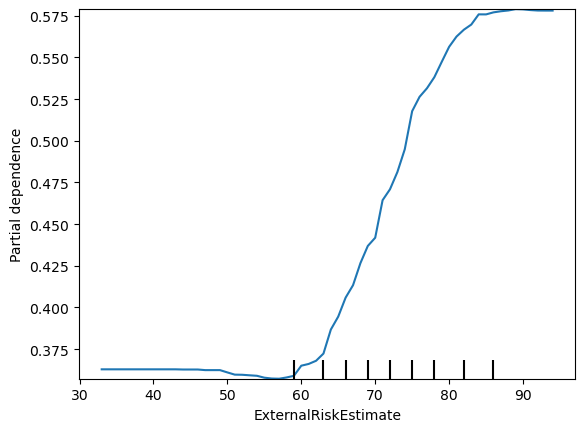

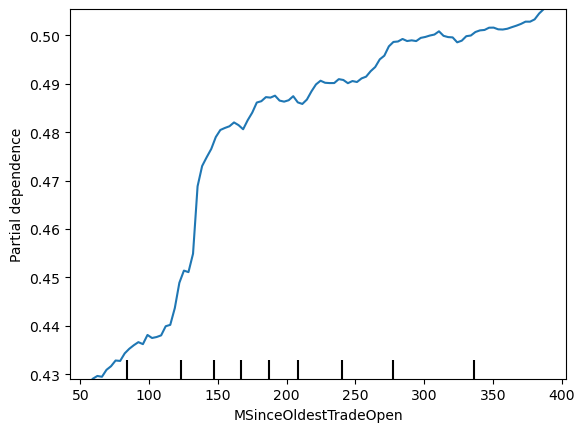

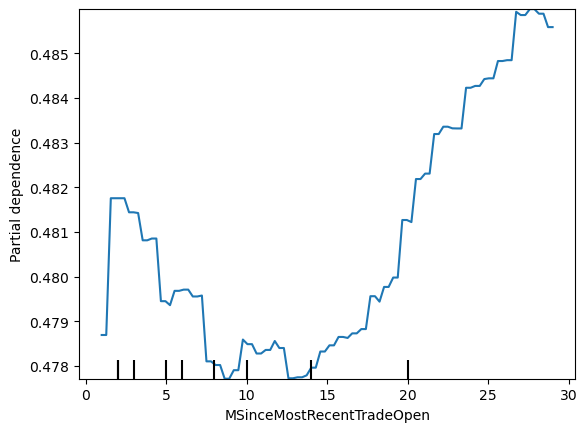

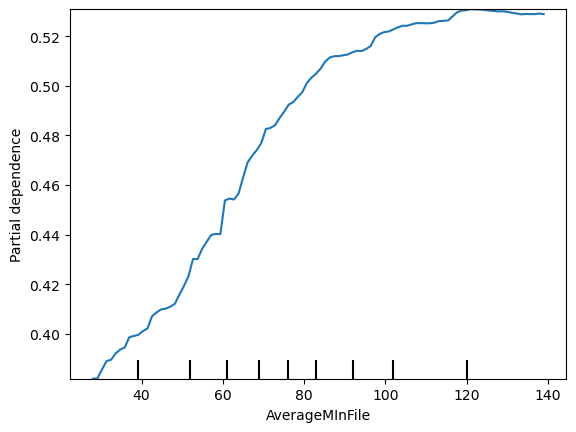

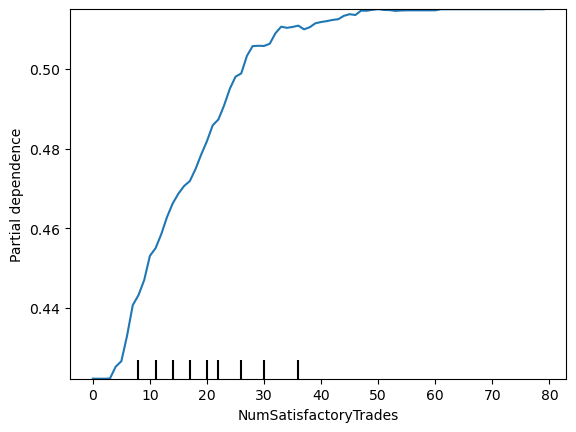

...

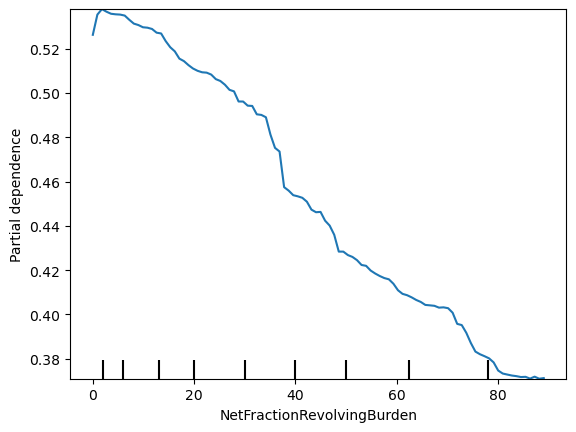

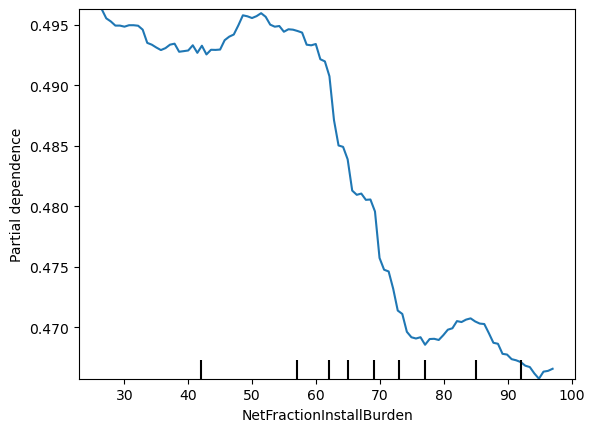

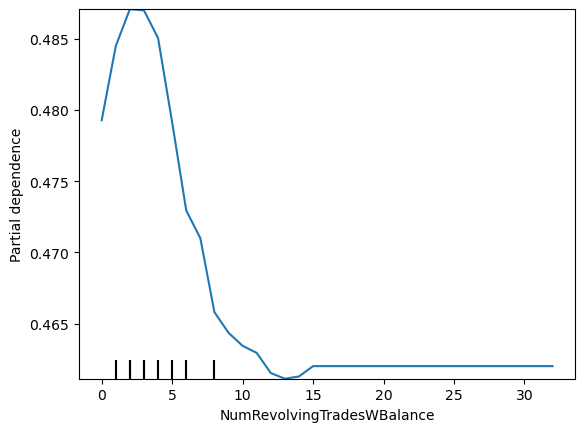

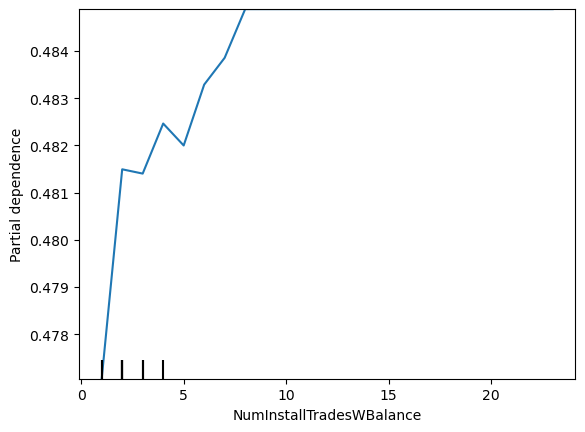

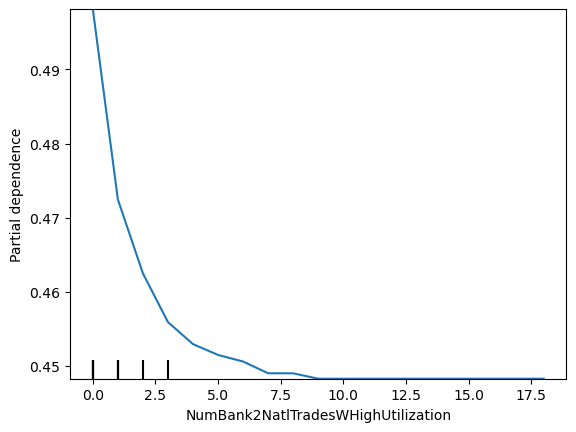

In [26]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
import matplotlib.pyplot as plt
#from sklearn.ensemble.partial_dependence import partial_dependence, plot_partial_dependence

cols_to_use = ['ExternalRiskEstimate', 'NetFractionRevolvingBurden', 'PercentTradesNeverDelq']

def get_some_data():
    data = pd.read_csv('D:/projects/XAI-finance2/dataset/HELOC1-2.csv')
    y = data.RiskPerformance
    X = data.drop("RiskPerformance", axis=1)
    #my_imputer = Imputer()
#     imputed_X = my_imputer.fit_transform(X)
    return X, y
    
loaded_rfc_model = joblib.load('D:/projects/XAI-finance2/FinalModels/rfc_pickle.pkl')
X, y = get_some_data()
my_model = loaded_rfc_model
my_model.fit(X, y)
# my_plots = plot_partial_dependence(my_model, 
#                                    features=[0,2], 
#                                    X=X, 
#                                    feature_names=cols_to_use, 
#                                    grid_resolution=10)
#pd_results = partial_dependence(fitted_model, X, features=0, kind="average")
for i in range(0,21):
    display = PartialDependenceDisplay.from_estimator(my_model, X, [i])
    #display.plot()
    plt.savefig('D:/projects/XAI-finance2/images/feature_' +str(i))

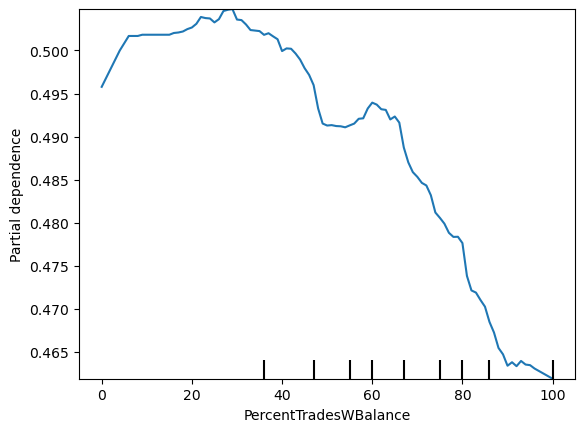

In [27]:
display = PartialDependenceDisplay.from_estimator(my_model, X, [21])
#display.plot()
plt.savefig('D:/projects/XAI-finance2/images/feature_21')

In [ ]:
'''
cols_to_use = ['Distance', 'Landsize', 'BuildingArea']

def get_some_data():
    data = pd.read_csv('../input/melbourne-housing-snapshot/melb_data.csv')
    y = data.Price
    X = data[cols_to_use]
    #my_imputer = Imputer()
    imputed_X = my_imputer.fit_transform(X)
    return imputed_X, y
    

X, y = get_some_data()
my_model = GradientBoostingRegressor()
my_model.fit(X, y)
my_plots = plot_partial_dependence(my_model, 
                                   features=[0,2], 
                                   X=X, 
                                   feature_names=cols_to_use, 
                                   grid_resolution=10)
'''